In [1]:
# -*- coding: utf-8 -*-
#  File: otus_adv_hw1_automl_atom.ipynb
#  Project: 'OTUS.ADV Homework #3'
#  Created by Gennady Matveev (gm@og.ly) on 10-02-2022.

# **$Homework$** **$3$**  
**OTUS Machine Learning Advanced**

### Time series clustering

![TS Clustering](https://docs.google.com/uc?export=download&id=1kP52pViswEsaHNrJUuCUxwXng4oBY3Cu)

Apply clustering algorithms to multiple time series (TS):
- A list of cryptocurrencies (CC), including Bitcoin (~100)
    - 30 days of closing prices
    - 3 days hourly closing prices
    - 1 hour minute closing prices
- Compare KNN (or similar) and DTW approaches;
- Try TS clustering after feature generation with TSFEL;
- Analyze composition of clusters without Bitcoin.

**Additional goals:**  

- Build risk profile for CC portfolios from one cluster and from
different clusters;
- Apply Matrix Profile methods from [matrixprofile](https://github.com/matrix-profile-foundation/matrixprofile) library  
to find repeated motifs and discords (anomalies) on CC from various clusters.

Goals:   

Apply clustering algorithms to multiple time series (TS):
- A list of cryptocurrencies (CC), including Bitcoin (~100)
    - 30 days of closing prices
    - 3 days hourly closing prices
    - 1 hour minute closing prices
- Compare KNN (or similar) and DTW approaches;
- Analyze composition of clusters without Bitcoin.

**Means:**  

- All meaningful computations will be done in [tslearn](https://github.com/tslearn-team/tslearn/) and [tsfel](https://github.com/fraunhoferportugal/tsfel). 

Data:
- CC prices will be downloaded with [cryptocompare](https://github.com/lagerfeuer/cryptocompare) library.

Abbreviations:
- TS: time series
- CC: cryptocurrency
- DTW: dynamic time warping
- H/P: hyperparameters

<a href="https://colab.research.google.com/github/oort77/OTUS_ADV_HW3/blob/main/notebooks/otus_adv_hw3_dtw.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Google colab specific part

Please uncomment below to install dependencies in Colab.

In [52]:
# !pip install -r "https://drive.google.com/uc?export=download&id=1U0MrFc0NTLH2r5DihKjlIuelvTDDhz27"

![slice1](https://drive.google.com/uc?export=download&id=15ss2sr9Ecl7nNaeSMo7fI7Gkio713cZQ)

### Import libraries and setup notebook

In [53]:
# %load_ext nb_black
import os
import sys
import pandas as pd
import numpy as np
import warnings
from tqdm.autonotebook import tqdm
from IPython.core.display import display, HTML
warnings.filterwarnings("ignore")

#### Import utilities functions

In [54]:
if os.path.abspath("..") not in sys.path:
    sys.path.insert(0, os.path.abspath(".."))
url_utils = "https://drive.google.com/uc?export=download&id=1ABoJOtHSmvCnF9IRLaxJqhFXupmXzVmk"
if not os.path.exists("../src/"):
    os.mkdir("../src")
    gdown.download(url_utils, output="../src/utilities.py.zip")
    shutil.unpack_archive("../src/utilities.py", "../src")   
from src.utilities import *

#### Miscellaneius settings 

In [55]:
%matplotlib inline
display(HTML("<style>.container { width:80% !important; }</style>"))
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = (10, 5)
sns.set(rc={"figure.figsize": (8, 5)})
pd.options.display.precision = 4

#### ML parameters

In [6]:
random_state = 17
n_jobs = -1 
scaler = StandardScaler()

### Load data

#### Set up cryptocompare API

In [7]:
set_api_key()

#### Download data, top-100 CC by market cap

In [8]:
all_data = get_data()
data_day, data_hour, data_minute = all_data

#### Save data to pickles

In [9]:
# pickle_data(data_day, data_hour, data_minute)

![slice2](https://drive.google.com/uc?export=download&id=1Bapr76q9lODV4LnZ3WEbHH_TO0_udMaC)

### CC data - visual check

In [10]:
data_day.head()

,BTC,ETH,XRP,USDT,BNB,SOL,USDC,LUNA,ADA,AVAX,...,FXS,HT,CHZ,ENJ,JASMY,ENS,XCH,DFI,BSV,ANC
0,42743.03,3240.32,0.7703,1.001,463.38,140.25,1.0000,73.51,1.188,89.64,...,0.0,9.403,0.2641,2.317,0.0708,26.75,88.52,2.618,110.19,2.592
1,43919.67,3373.03,0.7989,1.000,487.51,151.51,1.0000,81.91,1.312,96.02,...,0.0,9.509,0.2775,2.521,0.0730,27.99,95.48,2.994,112.83,2.704
2,42575.61,3242.26,0.7678,1.000,475.57,146.20,1.0000,78.36,1.233,89.76,...,0.0,9.511,0.2637,2.374,0.0695,25.69,92.94,2.971,109.33,2.600
3,43089.83,3309.66,0.7734,1.001,490.36,146.18,1.0000,81.45,1.293,90.40,...,0.0,9.855,0.2668,2.411,0.0707,26.28,91.61,3.001,113.02,2.503
4,43088.74,3328.63,0.7796,1.000,494.66,147.74,0.9996,87.30,1.292,93.08,...,0.0,10.020,0.2669,2.452,0.0703,26.68,92.12,3.102,112.63,2.506


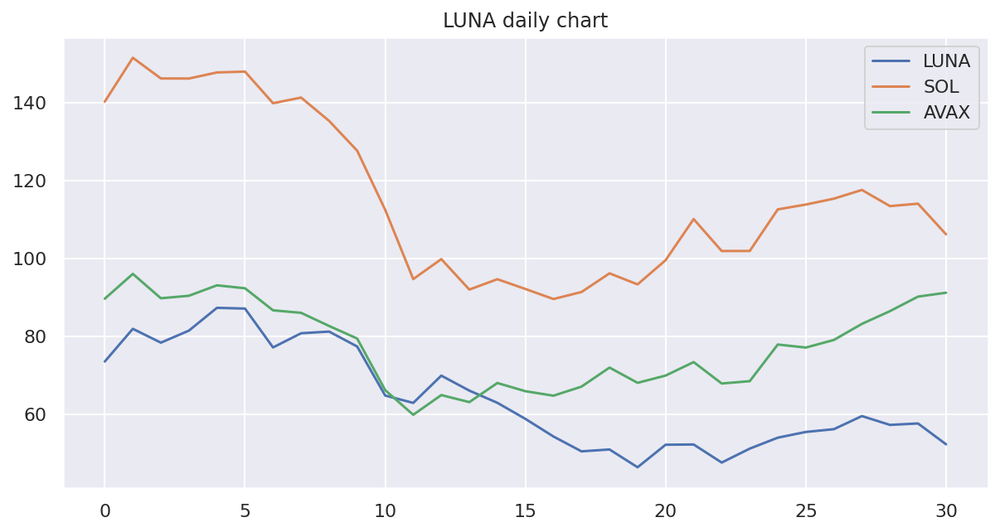

In [11]:
_ = data_day[["LUNA", "SOL", "AVAX"]].plot(title="LUNA daily chart", figsize=(10, 5))

In [12]:
data_hour.head()

,BTC,ETH,XRP,USDT,BNB,SOL,USDC,LUNA,ADA,AVAX,...,FXS,HT,CHZ,ENJ,JASMY,ENS,XCH,DFI,BSV,ANC
0,44093.55,3153.03,0.8012,1.001,435.07,117.99,1.0000,59.26,1.188,83.51,...,21.16,10.11,0.2338,2.121,0.0418,21.56,79.99,3.308,102.68,1.578
1,44104.37,3154.29,0.8265,1.001,434.96,118.10,0.9999,60.39,1.204,83.64,...,21.51,10.16,0.2347,2.127,0.0417,21.92,80.23,3.326,103.03,1.592
2,43861.07,3141.38,0.8318,1.001,433.75,117.57,1.0000,59.51,1.199,83.18,...,21.16,10.09,0.2337,2.090,0.0411,21.81,80.49,3.338,102.15,1.604
3,43886.13,3132.57,0.8260,1.001,433.08,117.11,1.0000,58.84,1.237,82.59,...,21.24,10.02,0.2326,2.085,0.0412,21.81,80.05,3.357,103.04,1.603
4,44081.16,3154.16,0.8684,1.001,435.15,118.78,1.0000,59.67,1.251,83.36,...,21.47,10.02,0.2355,2.127,0.0416,22.75,80.62,3.411,104.23,1.627


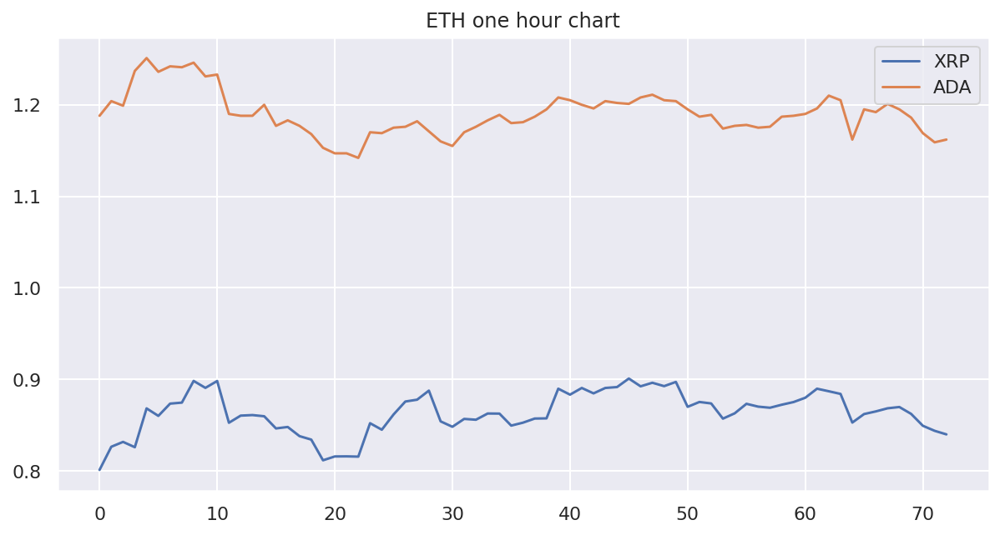

In [13]:
_ = data_hour[["XRP", "ADA"]].plot(title="ETH one hour chart", figsize=(10, 5))

In [14]:
data_minute.head()

,BTC,ETH,XRP,USDT,BNB,SOL,USDC,LUNA,ADA,AVAX,...,FXS,HT,CHZ,ENJ,JASMY,ENS,XCH,DFI,BSV,ANC
0,44571.95,3132.77,0.8549,1.001,422.01,109.21,1.0000,53.99,1.172,91.91,...,21.08,10.02,0.2314,2.032,0.0401,19.35,82.77,3.671,99.84,1.811
1,44618.14,3136.05,0.8554,1.001,422.12,109.35,1.0000,54.03,1.173,91.98,...,21.10,10.03,0.2315,2.033,0.0401,19.37,82.86,3.675,99.94,1.814
2,44580.50,3133.94,0.8546,1.001,421.80,109.16,0.9999,53.90,1.172,91.70,...,20.96,10.01,0.2315,2.033,0.0399,19.34,82.61,3.672,99.86,1.815
3,44559.75,3135.46,0.8547,1.001,421.87,109.14,1.0000,53.78,1.171,91.76,...,21.08,10.00,0.2310,2.032,0.0401,19.34,82.66,3.670,99.72,1.812
4,44568.13,3137.96,0.8540,1.001,421.83,109.28,1.0010,53.89,1.172,91.93,...,20.95,10.03,0.2312,2.038,0.0399,19.31,82.67,3.665,99.74,1.815


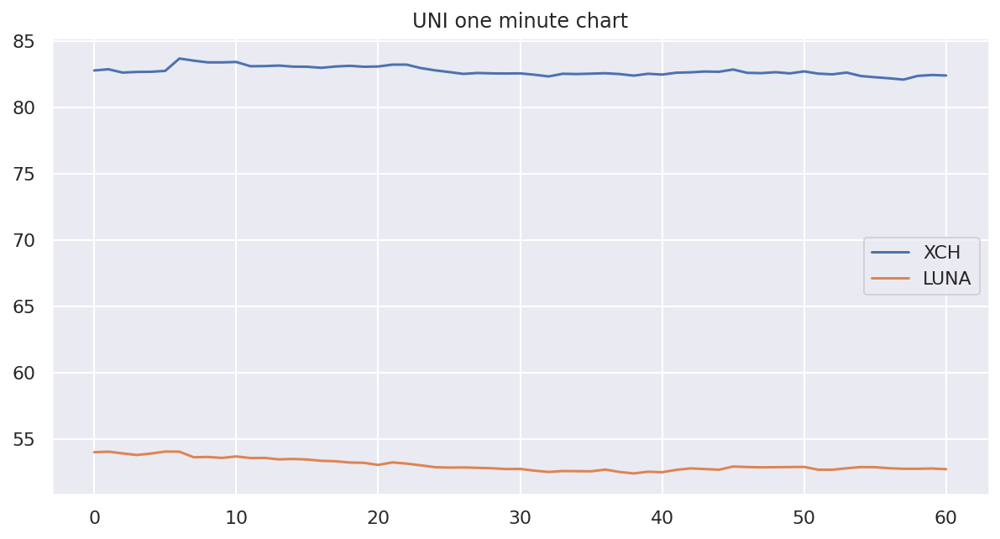

In [15]:
_ = data_minute[["XCH", "LUNA"]].plot(title="UNI one minute chart", figsize=(10, 5))

![slice3](https://drive.google.com/uc?export=download&id=1Xvrbtz-xHvvk2Tmxtx0B3j-PP2GEjuOD) 

### Run clustering study with TSLEARN TimeSeriesKMeans

#### Daily charts

##### KNeighbours, euclidean metric

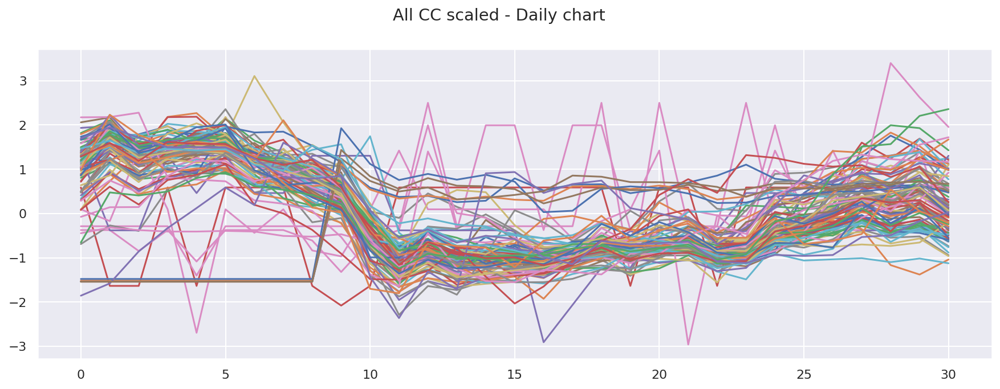

  0%|          | 0/8 [00:00<?, ?it/s]

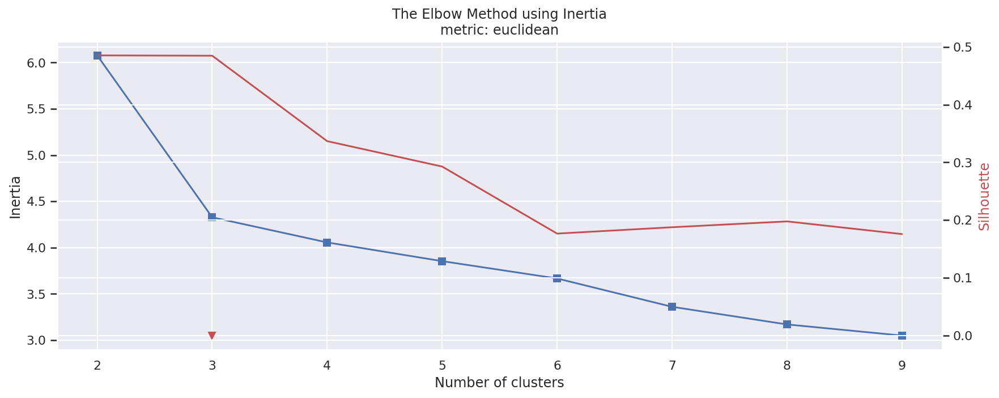

Optimal number of clusters: 3


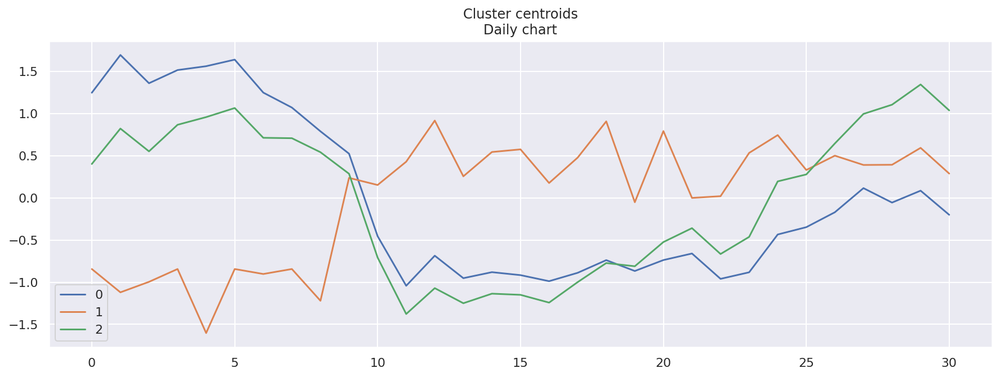

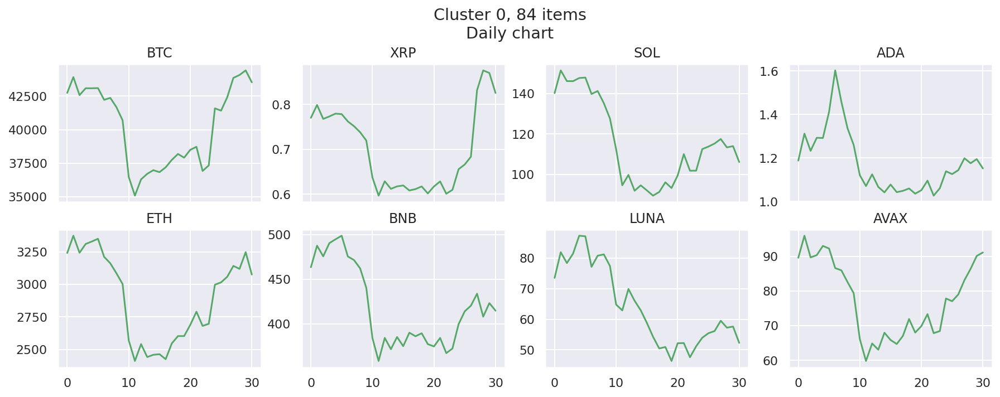

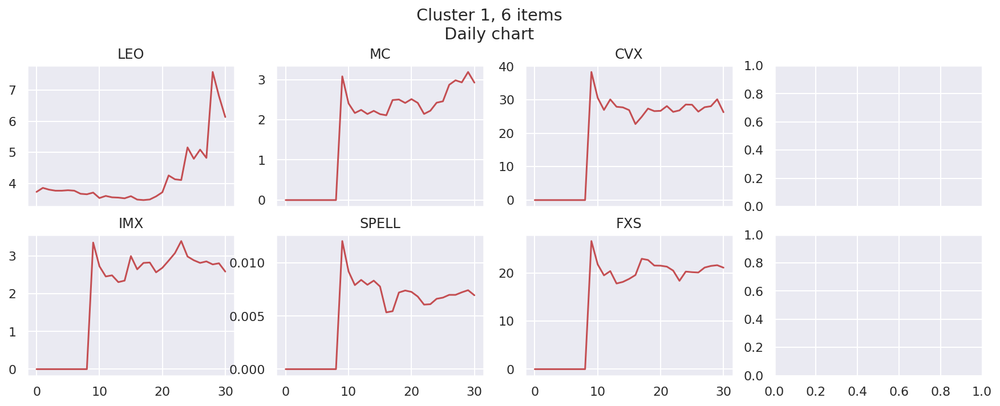

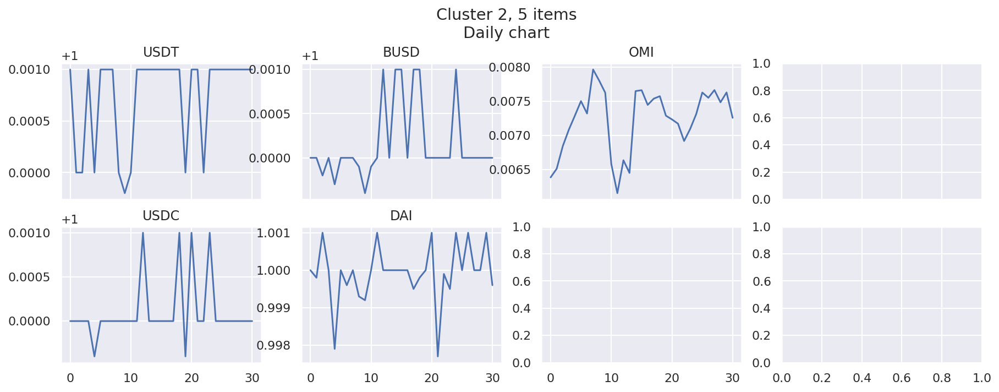

In [16]:
clustering_study(data_day, metric="euclidean", title="Daily chart")

![slice3](https://drive.google.com/uc?export=download&id=1Xvrbtz-xHvvk2Tmxtx0B3j-PP2GEjuOD) 

##### KNeighbours, DTW

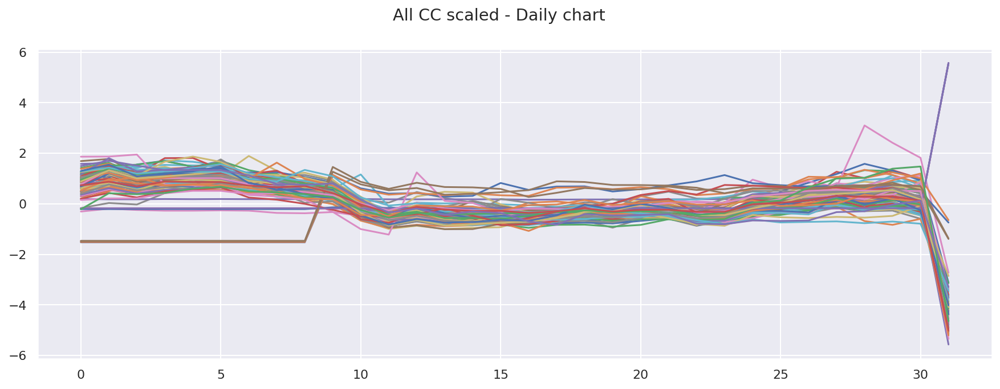

  0%|          | 0/8 [00:00<?, ?it/s]

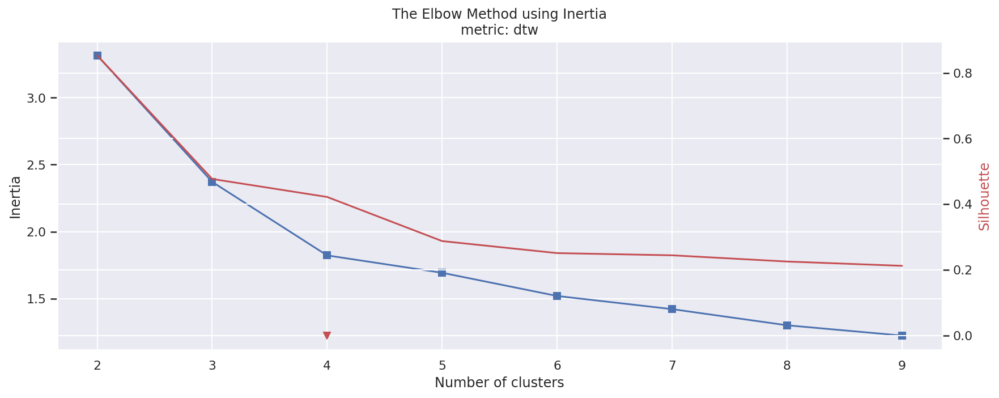

Optimal number of clusters: 4


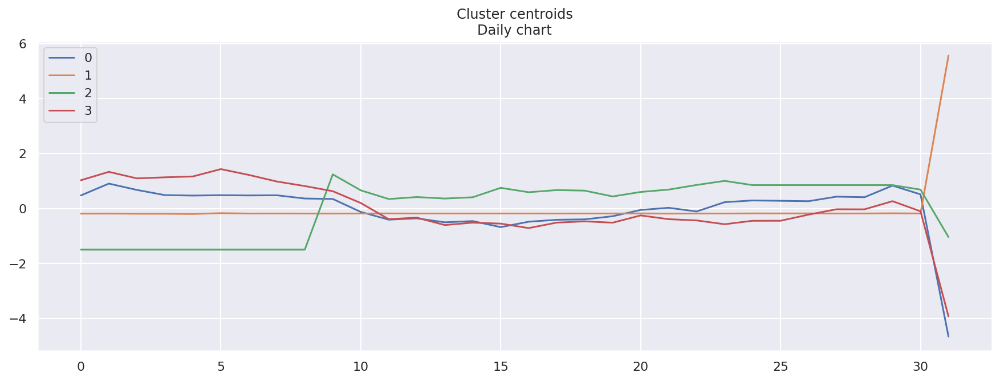

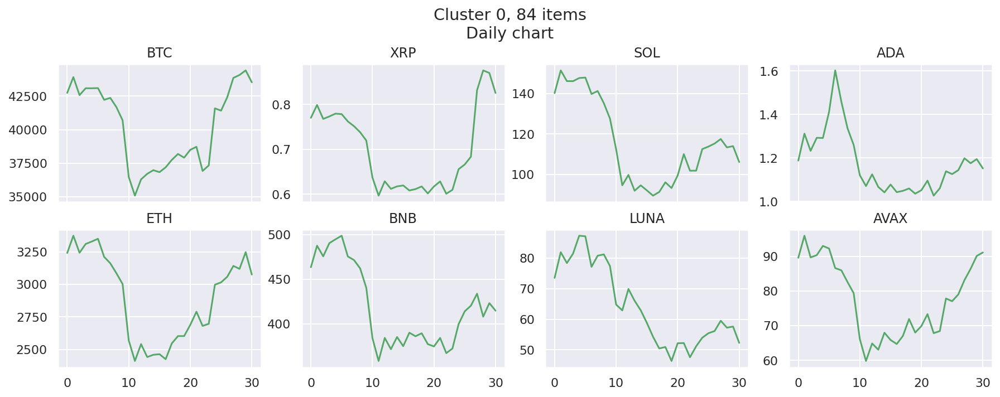

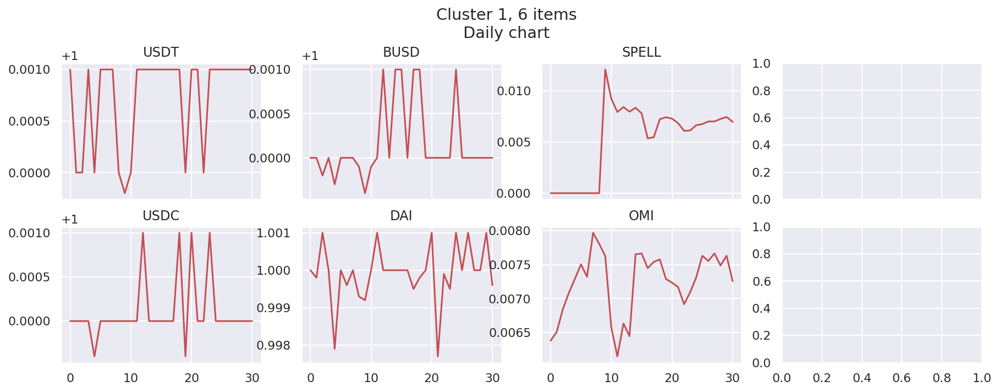

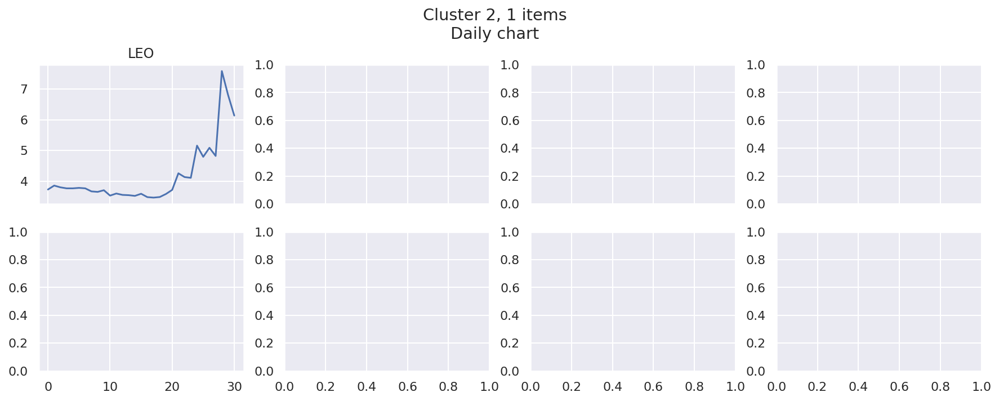

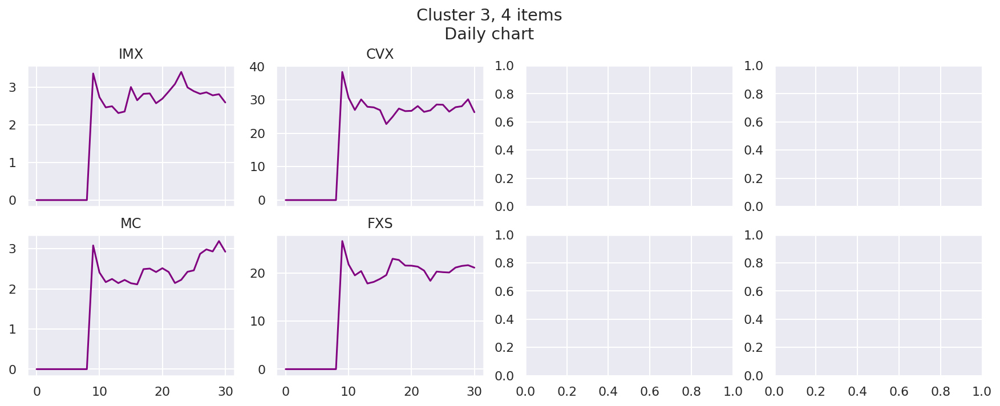

In [17]:
clustering_study(data_day, metric="dtw", title="Daily chart")

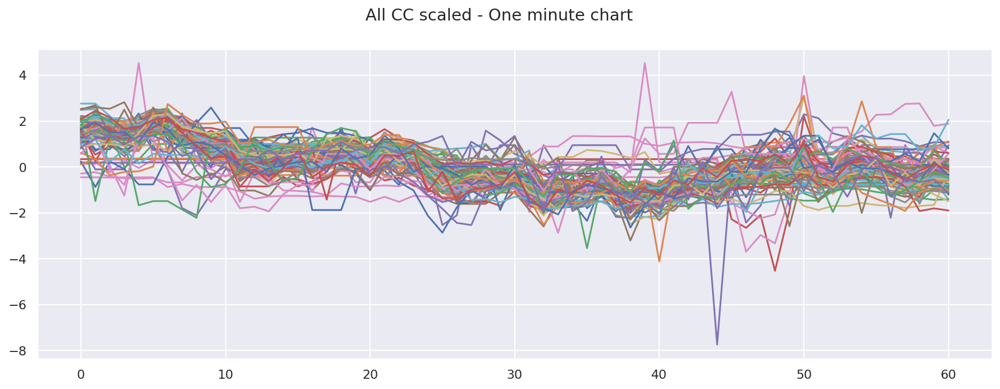

  0%|          | 0/8 [00:00<?, ?it/s]

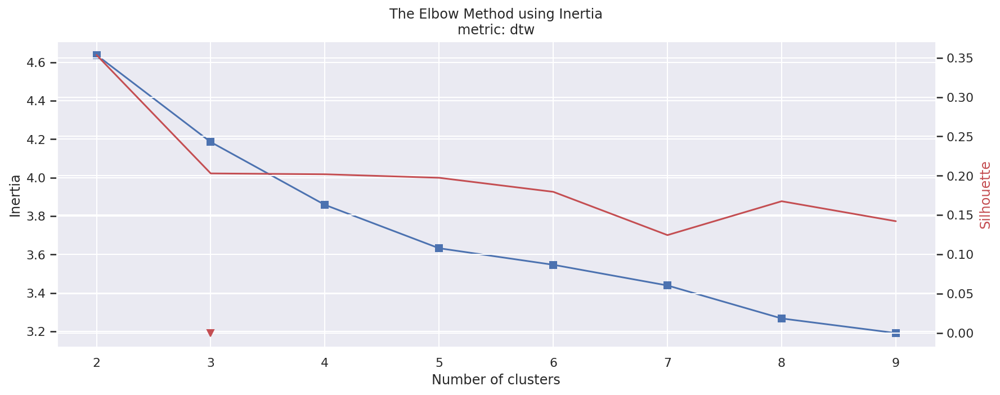

Optimal number of clusters: None


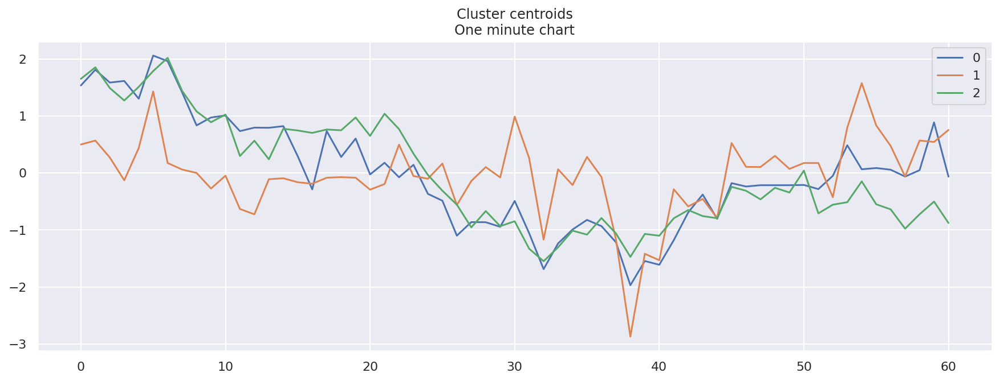

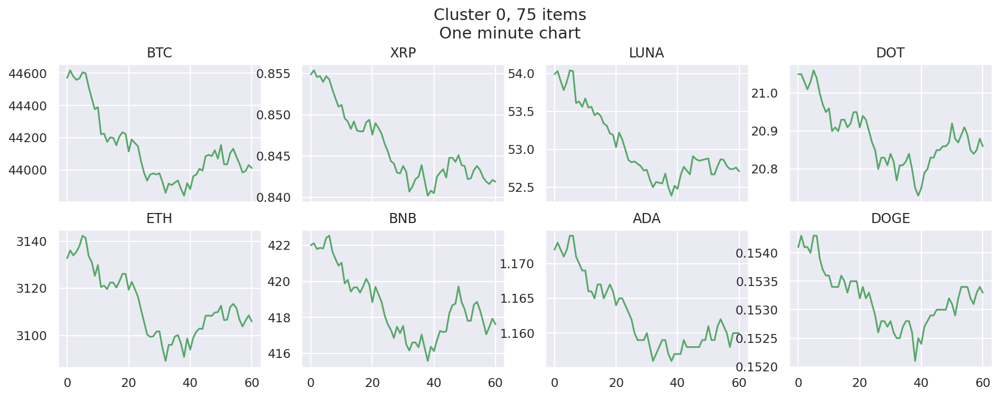

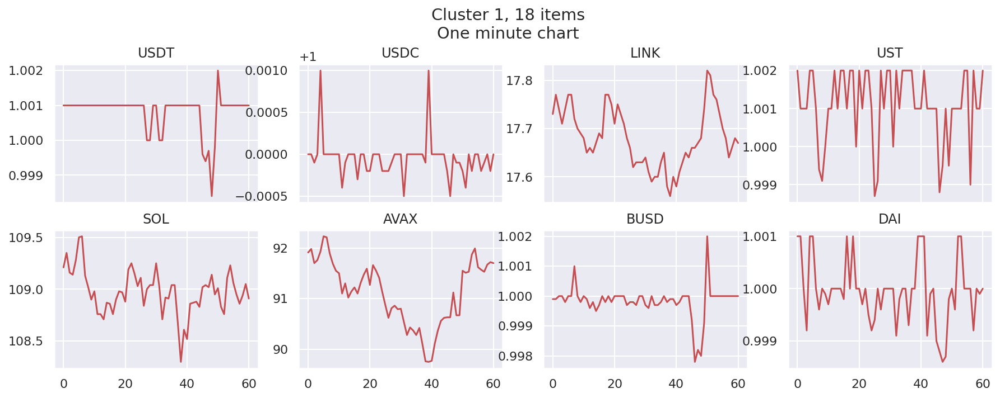

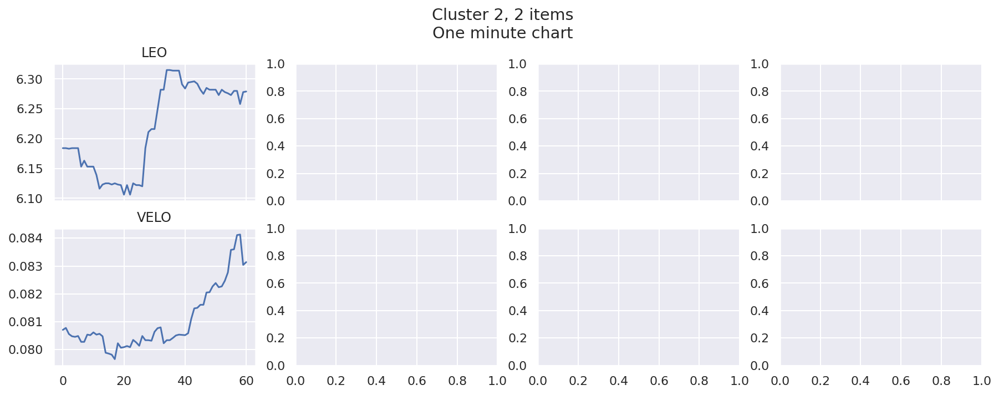

In [18]:
clustering_study(data_minute, metric="dtw", title="One minute chart")

![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)

#### One hour charts

##### KNeighbours, euclidean metric

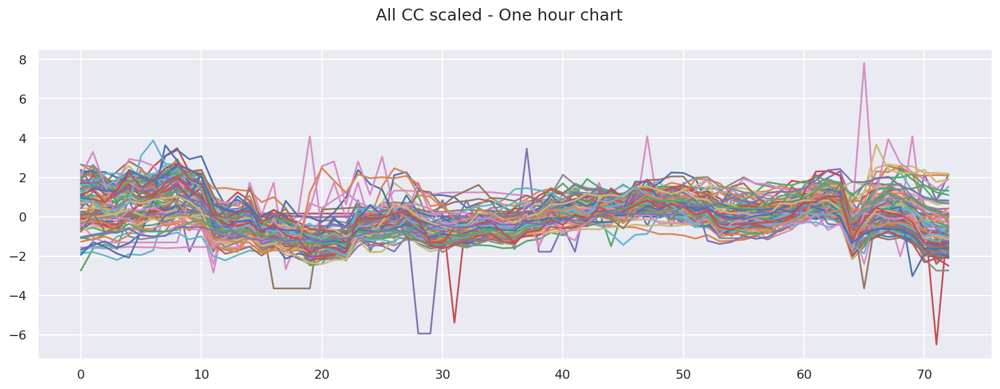

  0%|          | 0/8 [00:00<?, ?it/s]

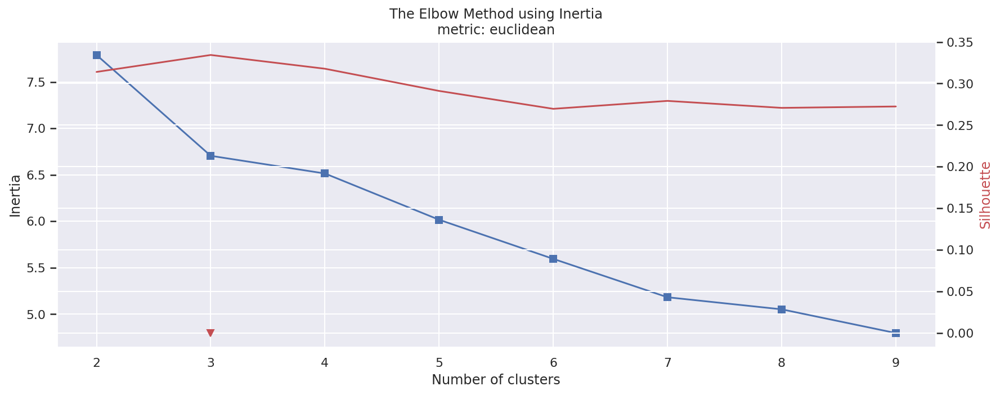

Optimal number of clusters: None


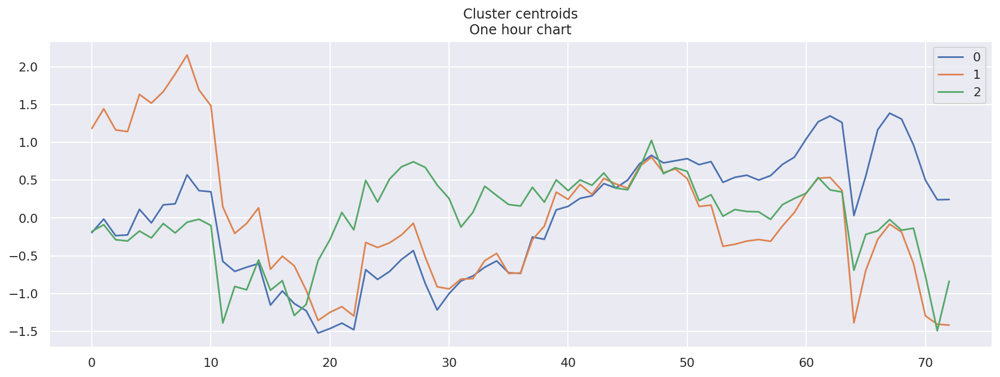

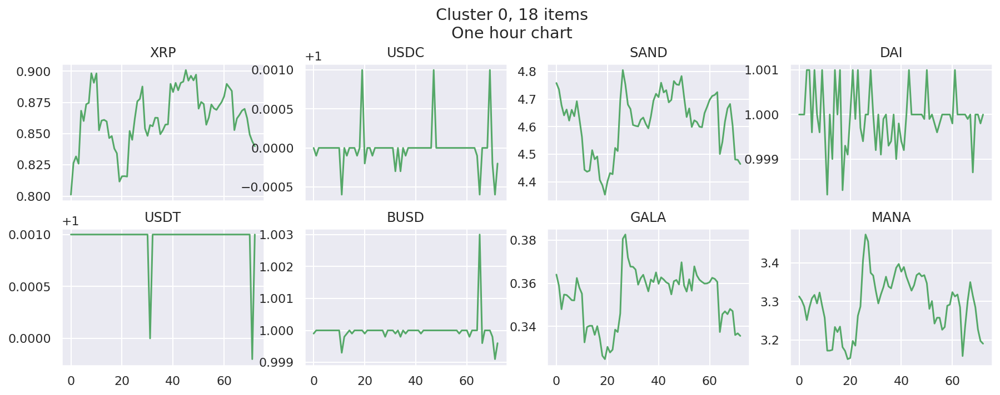

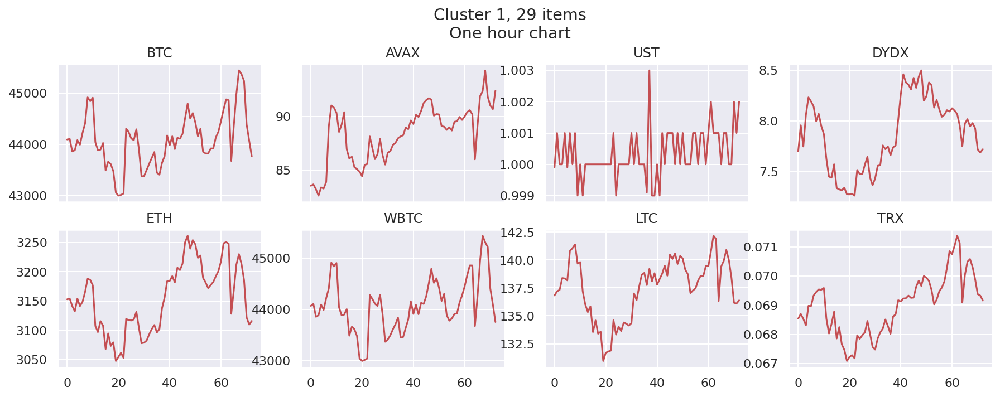

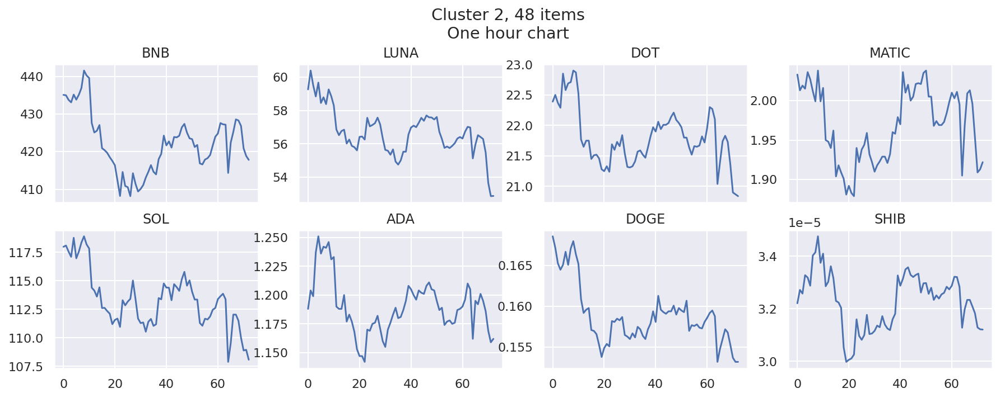

In [19]:
clustering_study(data_hour, metric="euclidean", title="One hour chart")

![slice6](https://drive.google.com/uc?export=download&id=1updrFKIPTzfVguR8_FQ8kTklpbvIrDqo)

##### KNeighbours, DTW

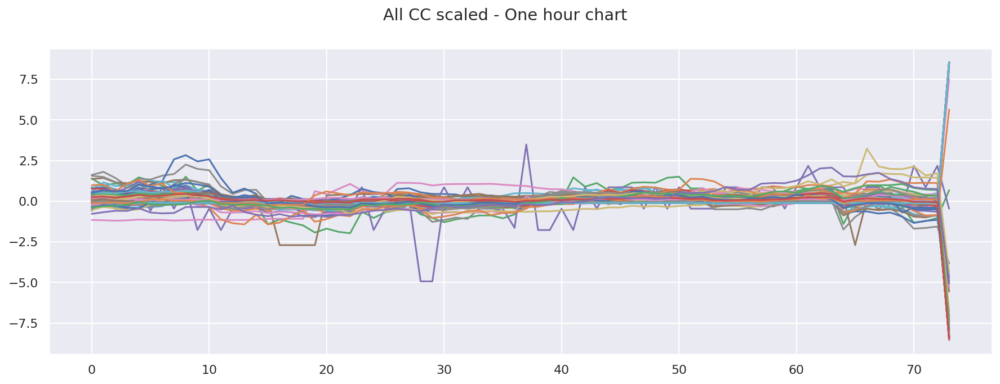

  0%|          | 0/8 [00:00<?, ?it/s]

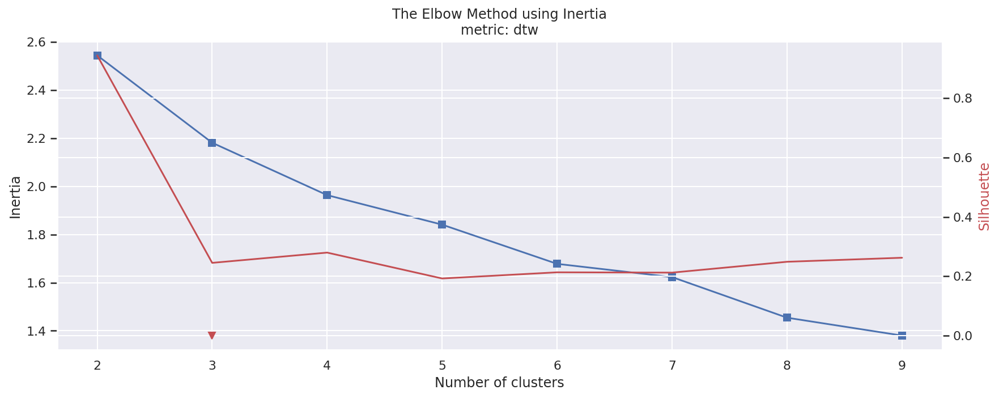

Optimal number of clusters: None


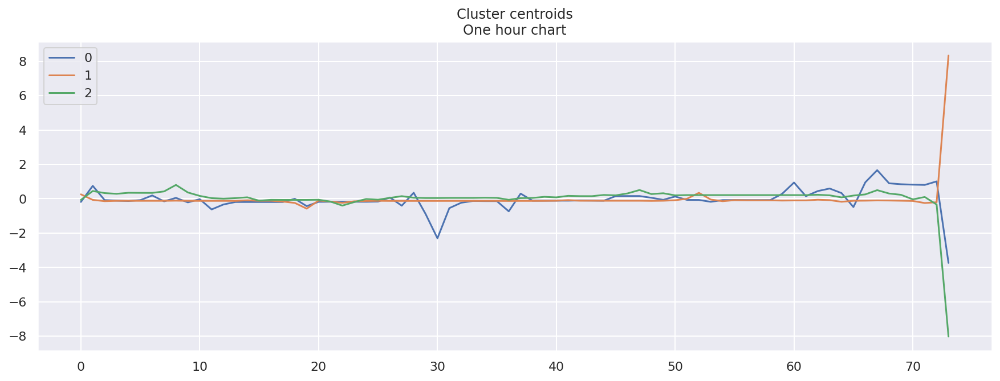

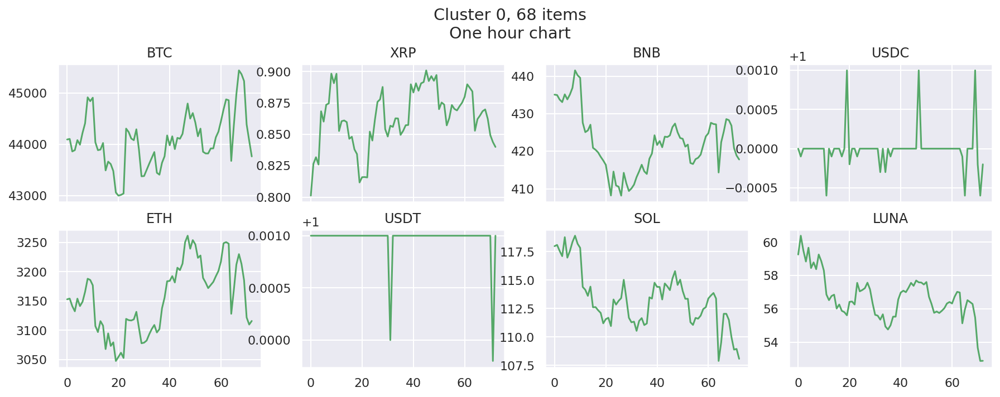

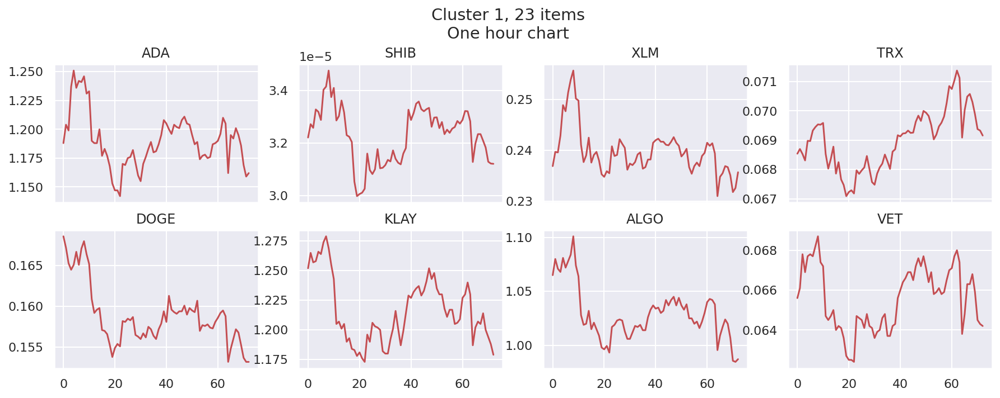

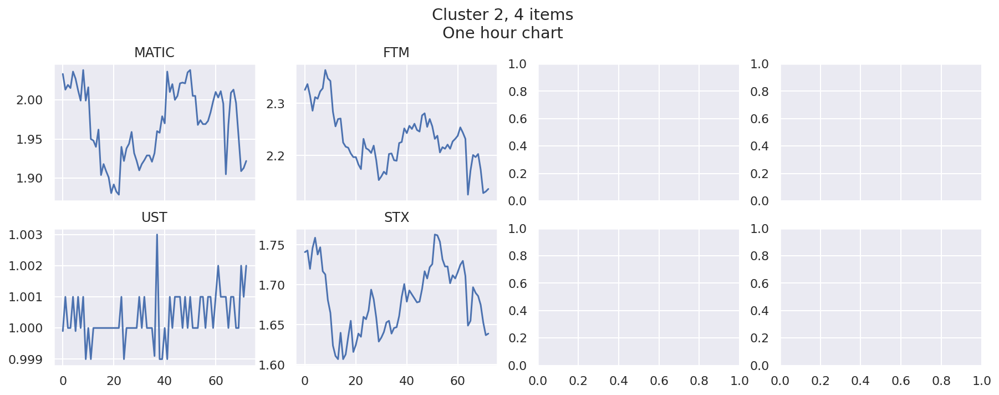

In [20]:
clustering_study(data_hour, metric="dtw", title="One hour chart")

![slice1](https://drive.google.com/uc?export=download&id=15ss2sr9Ecl7nNaeSMo7fI7Gkio713cZQ)


#### One minute charts

##### KNeighbours, euclidean metric

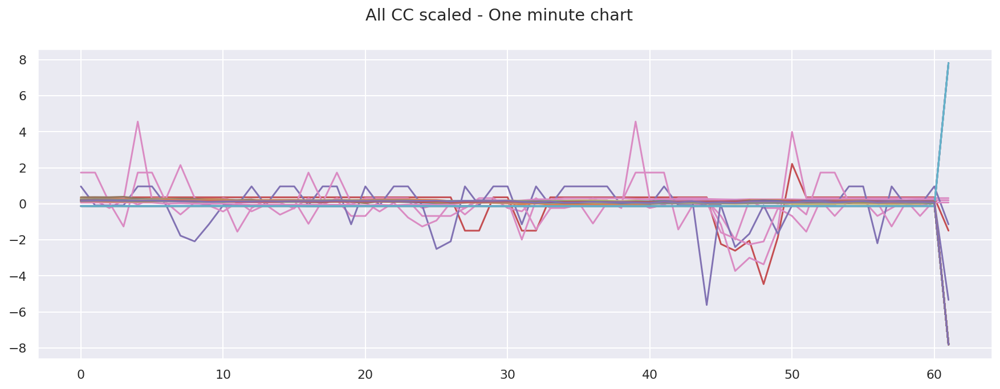

  0%|          | 0/8 [00:00<?, ?it/s]

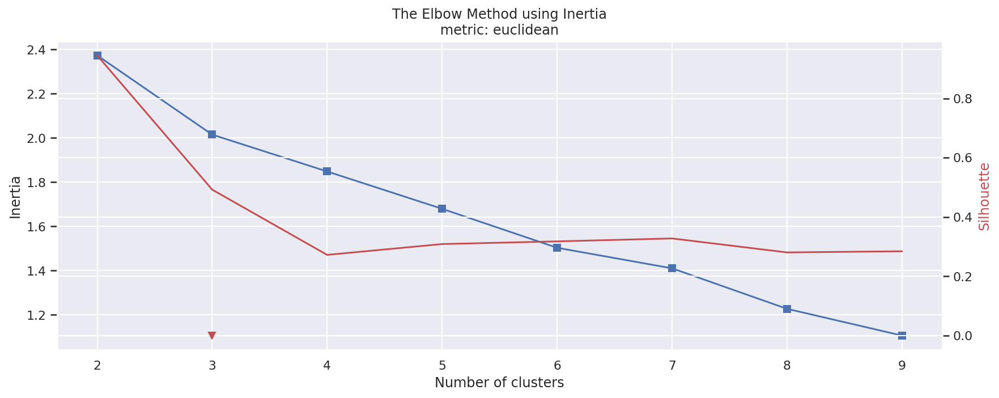

Optimal number of clusters: None


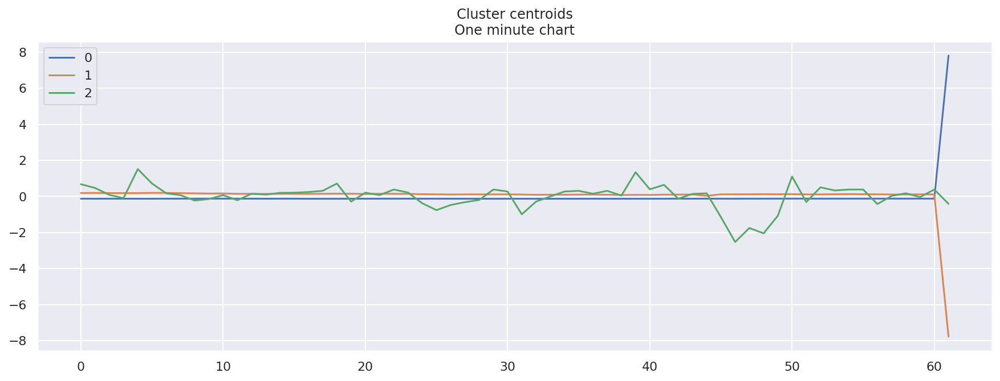

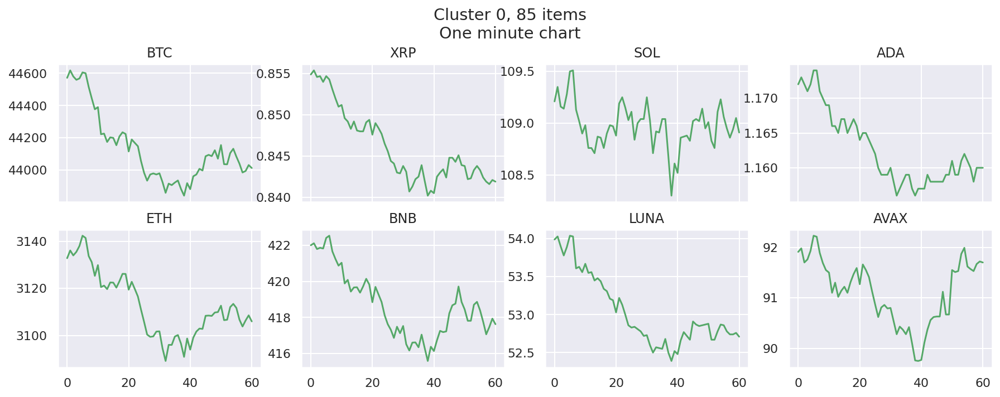

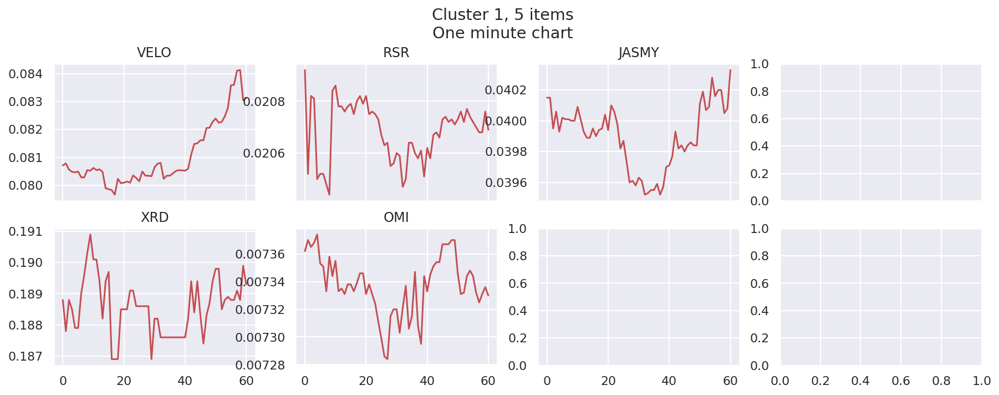

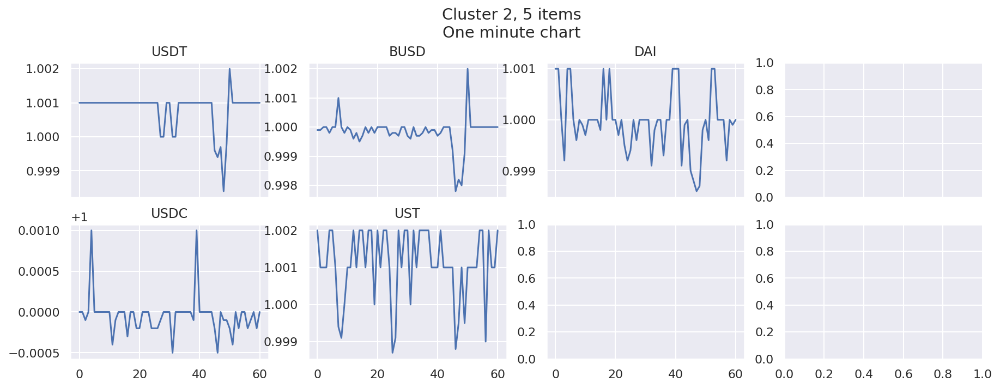

In [21]:
clustering_study(data_minute, metric="euclidean", title="One minute chart")

![slice2](https://drive.google.com/uc?export=download&id=1Bapr76q9lODV4LnZ3WEbHH_TO0_udMaC)

##### KNeighbours, DTW

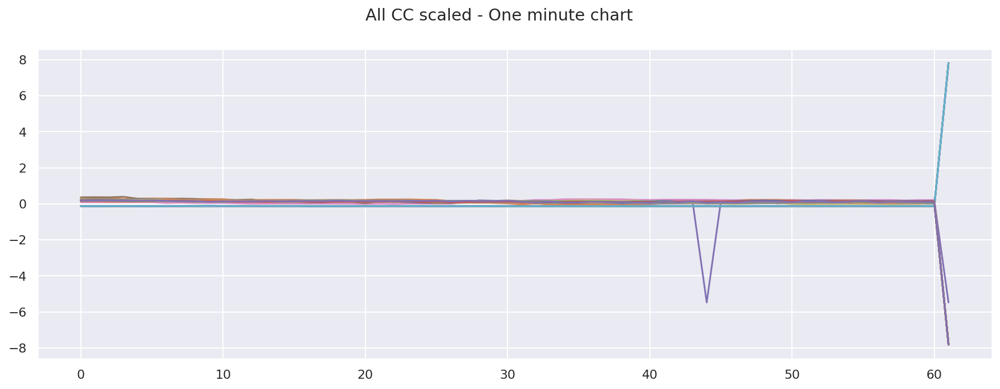

  0%|          | 0/8 [00:00<?, ?it/s]

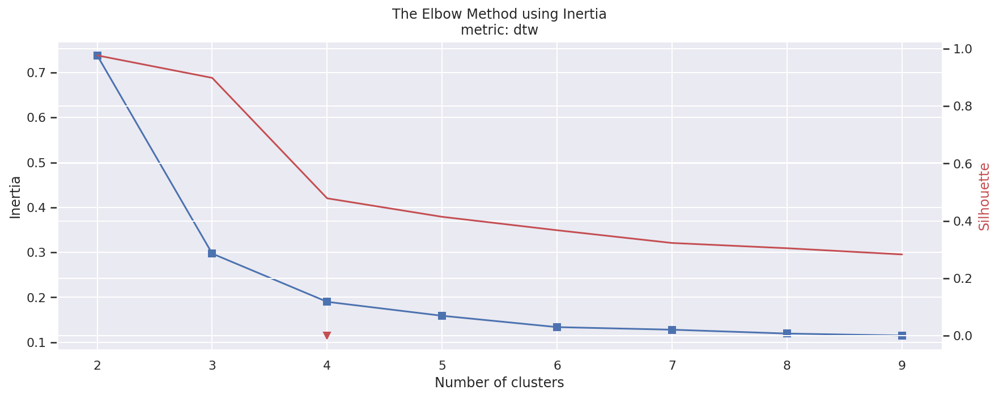

Optimal number of clusters: 4


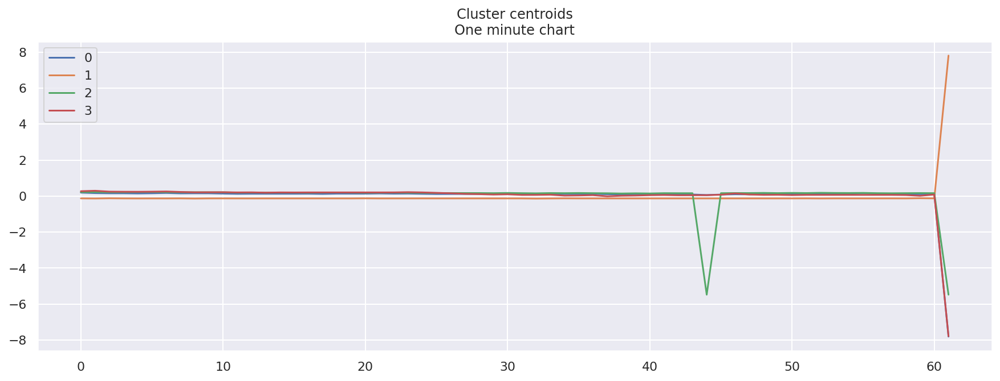

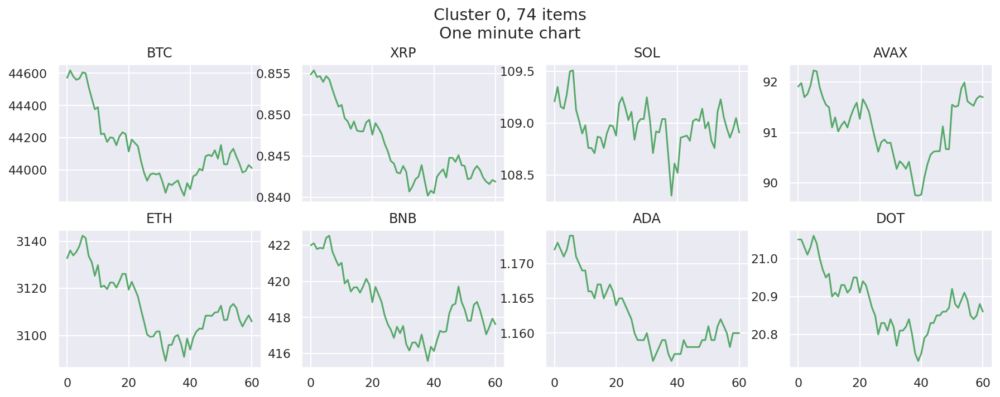

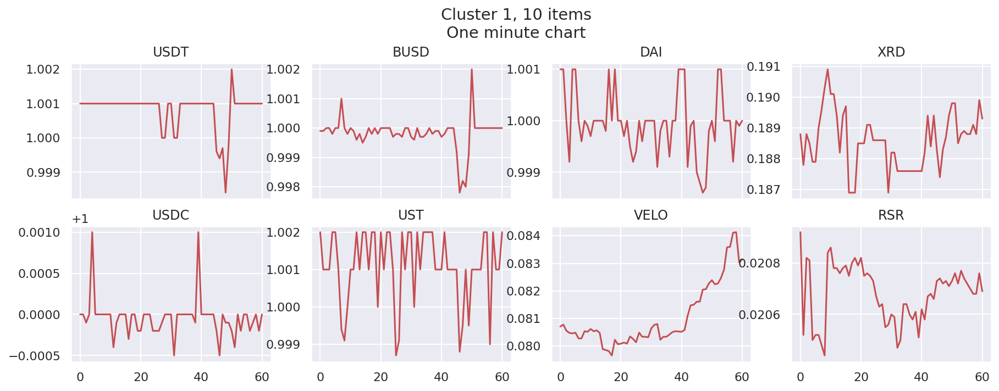

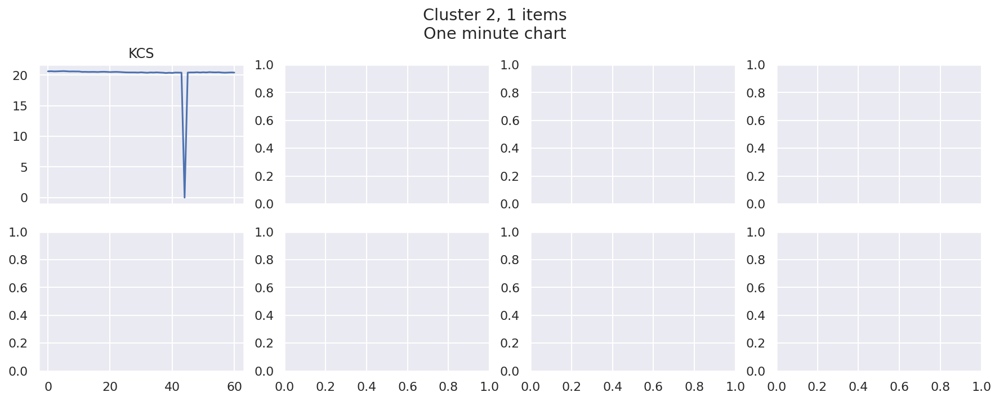

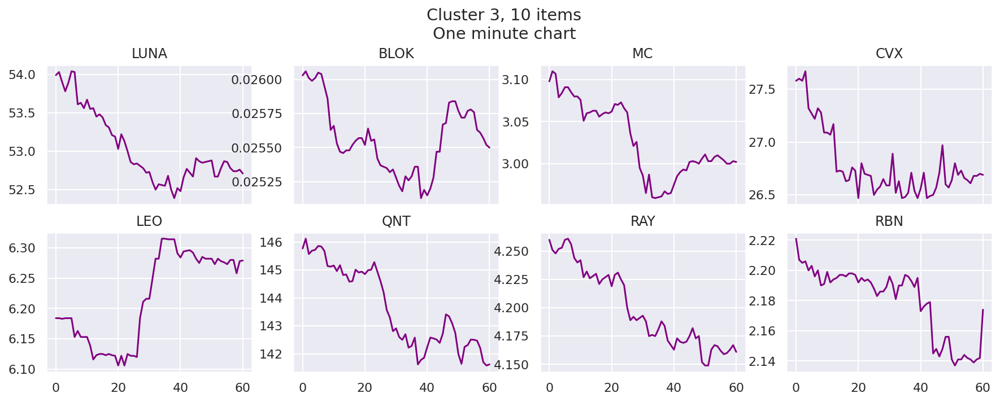

In [22]:
clustering_study(data_minute, metric="dtw", title="One minute chart")

![slice2](https://drive.google.com/uc?export=download&id=1Bapr76q9lODV4LnZ3WEbHH_TO0_udMaC)
![slice3](https://drive.google.com/uc?export=download&id=1Xvrbtz-xHvvk2Tmxtx0B3j-PP2GEjuOD)  
![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)

###  Clustering analysis with TSFEL

#### Choose domain: statistical, temporal, spectral or all combined

In [23]:
# Uncomment the line with a chosen domain

# cfg_file = tsfel.get_features_by_domain()  # All features will be extracted.
# cgf_file = tsfel.get_features_by_domain("statistical")  # All statistical domain features will be extracted
cfg_file = tsfel.get_features_by_domain("temporal")     # All temporal domain features will be extracted
# cfg_file = tsfel.get_features_by_domain("spectral")     # All spectral domain features will be extracted

In [24]:
data_day.head()

,BTC,ETH,XRP,USDT,BNB,SOL,USDC,LUNA,ADA,AVAX,...,FXS,HT,CHZ,ENJ,JASMY,ENS,XCH,DFI,BSV,ANC
0,42743.03,3240.32,0.7703,1.001,463.38,140.25,1.0000,73.51,1.188,89.64,...,0.0,9.403,0.2641,2.317,0.0708,26.75,88.52,2.618,110.19,2.592
1,43919.67,3373.03,0.7989,1.000,487.51,151.51,1.0000,81.91,1.312,96.02,...,0.0,9.509,0.2775,2.521,0.0730,27.99,95.48,2.994,112.83,2.704
2,42575.61,3242.26,0.7678,1.000,475.57,146.20,1.0000,78.36,1.233,89.76,...,0.0,9.511,0.2637,2.374,0.0695,25.69,92.94,2.971,109.33,2.600
3,43089.83,3309.66,0.7734,1.001,490.36,146.18,1.0000,81.45,1.293,90.40,...,0.0,9.855,0.2668,2.411,0.0707,26.28,91.61,3.001,113.02,2.503
4,43088.74,3328.63,0.7796,1.000,494.66,147.74,0.9996,87.30,1.292,93.08,...,0.0,10.020,0.2669,2.452,0.0703,26.68,92.12,3.102,112.63,2.506


![slice5](https://drive.google.com/uc?export=download&id=1tO_u4a_RioPUolVviZLhJrriXe7kZ3XO) 

#### Temporal domain

##### Extract features in chosen domain

In [26]:
# *****************************************************
with open("../data/data_100_days.pickle", "rb") as f:
    data_day = pickle.load(f)

In [29]:
# Get list of features names
x_temp = tsfel.time_series_features_extractor(cfg_file, data_day["BTC"], window_size=100) # <--------------------- 30
tf_columns = x_temp.columns
xtf = pd.DataFrame(columns=data_day.columns, index=tf_columns)

# Scale prices?
dd = data_day.copy()
dd = pd.DataFrame(scaler.fit_transform(dd), columns=dd.columns, index=dd.index)

# Fill df with features
for col in xtf.columns:
    xtf[col] = tsfel.time_series_features_extractor(
        cfg_file, data_day[col], window_size=100 # <--------------------- 30
    ).T
xtf.dropna(inplace=True)
Xt = pd.DataFrame(scaler.fit_transform(xtf), columns=data_day.columns, index=xtf.index)

*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***


##### Check features dataset

In [30]:
Xt.head()

,BTC,ETH,XRP,USDT,BNB,SOL,USDC,LUNA,ADA,AVAX,...,FXS,HT,CHZ,ENJ,JASMY,ENS,XCH,DFI,BSV,ANC
0_Absolute energy,2.2270,2.2270,1.6503,1.8646,2.2270,2.2270,1.8597,2.2270,2.1291,2.2270,...,2.2269,2.2270,0.0274,2.2189,-0.3139,2.2270,2.2270,2.2235,2.2270,2.2187
0_Area under the curve,-0.4472,-0.4472,-0.6122,-0.5497,-0.4472,-0.4472,-0.5609,-0.4472,-0.5491,-0.4472,...,-0.4501,-0.4480,-0.4507,-0.4774,-0.3701,-0.4475,-0.4471,-0.4660,-0.4471,-0.4789
0_Autocorrelation,2.2270,2.2270,1.6503,1.8646,2.2270,2.2270,1.8597,2.2270,2.1291,2.2270,...,2.2269,2.2270,0.0274,2.2189,-0.3139,2.2270,2.2270,2.2235,2.2270,2.2187
0_Centroid,-0.4472,-0.4472,-0.6257,-0.5618,-0.4472,-0.4473,-0.5730,-0.4476,-0.5621,-0.4475,...,-0.4511,-0.4506,-0.4505,-0.4856,-0.3641,-0.4481,-0.4473,-0.4727,-0.4473,-0.4862
0_Entropy,-0.4472,-0.4472,-0.6083,-0.5683,-0.4472,-0.4473,-0.5791,-0.4476,-0.5544,-0.4475,...,-0.4512,-0.4505,-0.4214,-0.4833,-0.3316,-0.4481,-0.4473,-0.4715,-0.4473,-0.4843


##### Distribution of distances in time features dataset

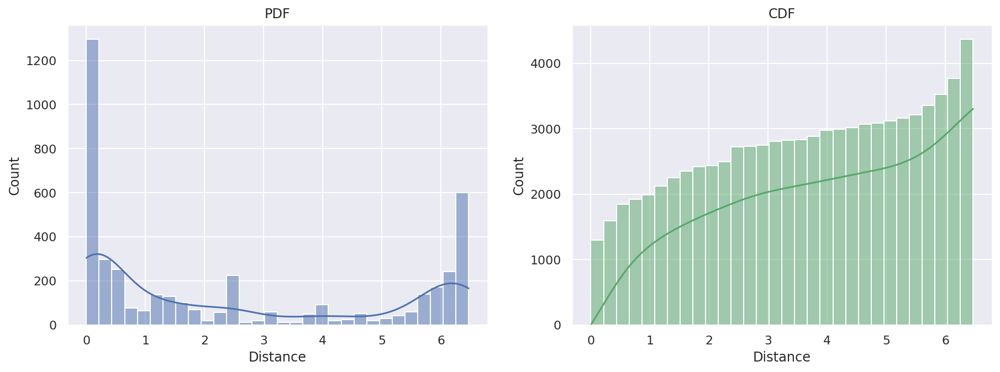

In [31]:
distances_distr_plot(Xt)

##### Estimate optimal number of clusters with elbow and Davies-Bouldin methods

  0%|          | 0/8 [00:00<?, ?it/s]

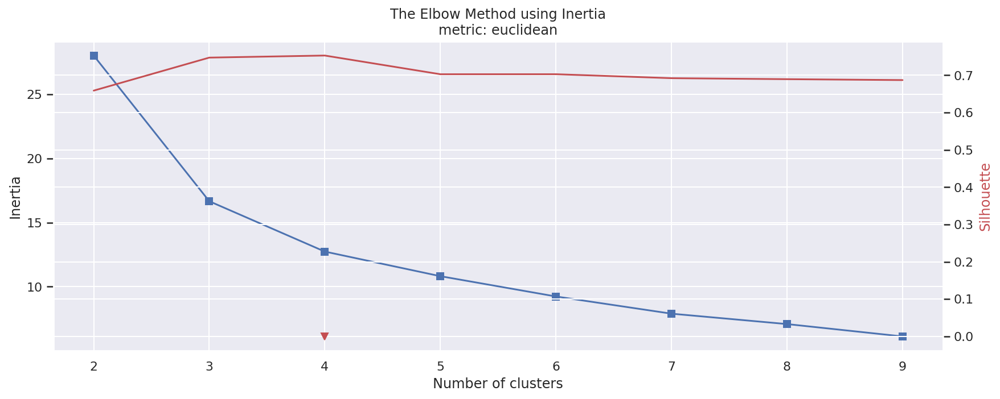

Optimal number of clusters: 4


In [32]:
n_clusters = elbow_study(Xt.T, metric="euclidean", model=KMeans)

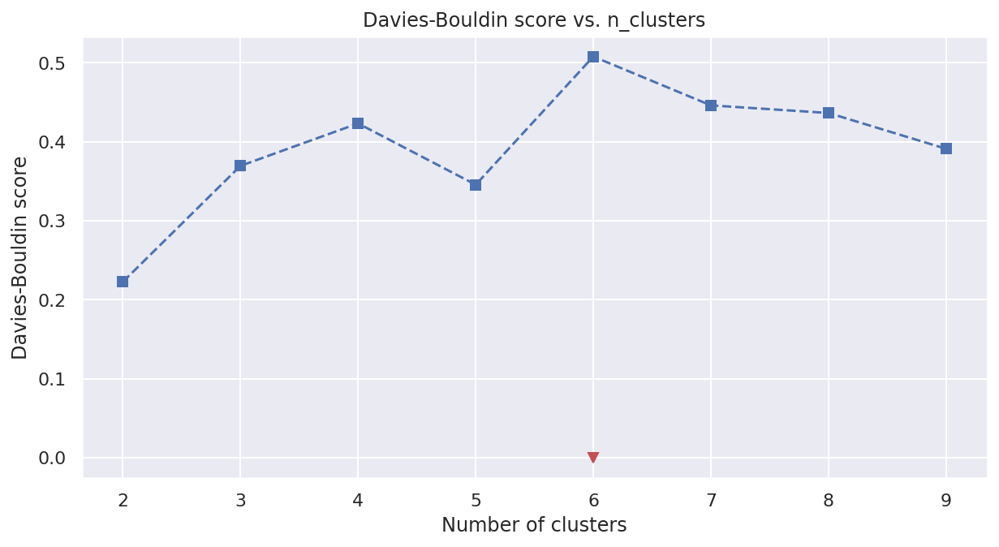

Optimal number of clusters: 6


In [33]:
n_clusters_dv = davies_bouldin_plot(Xt)

![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)

##### Plot clusters' charts - temporal domain, daily data

,BTC,ETH,XRP,USDT,BNB,SOL,USDC,LUNA,ADA,AVAX,...,FXS,HT,CHZ,ENJ,JASMY,ENS,XCH,DFI,BSV,ANC
0,61019.66,4480.09,1.1600,1.001,607.77,236.34,1.0000,49.93,1.983,74.26,...,0.00,10.400,0.4598,2.963,0.2211,0.00,190.02,2.854,173.91,3.396
1,61529.76,4521.41,1.1520,1.001,637.58,258.63,1.0000,51.19,2.005,78.60,...,0.00,10.340,0.5068,3.510,0.2074,0.00,191.60,2.910,168.90,3.418
2,63302.78,4617.13,1.2200,1.001,649.78,249.76,1.0000,50.57,2.020,87.88,...,0.00,10.670,0.4888,3.316,0.2382,0.00,189.85,3.041,168.83,3.463
3,67549.14,4810.97,1.2830,1.001,653.81,248.35,0.9998,54.17,2.126,91.46,...,0.00,10.640,0.4798,3.171,0.2244,0.00,183.53,3.341,178.13,3.594
4,66939.24,4732.07,1.2570,1.000,635.14,239.03,1.0000,50.22,2.268,88.79,...,0.00,10.660,0.4710,2.977,0.2150,43.40,172.97,3.405,194.19,3.861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,43531.67,3074.84,0.8256,1.001,414.79,106.18,1.0000,52.26,1.152,91.18,...,21.07,10.010,0.2241,1.989,0.0397,18.94,81.88,3.620,98.60,1.850
98,42398.98,2928.93,0.7596,1.001,400.83,96.52,1.0000,50.42,1.080,81.81,...,22.48,9.913,0.2056,1.830,0.0365,17.24,81.15,3.531,94.76,1.692
99,42239.01,2918.34,0.8226,1.001,403.60,95.96,1.0000,52.17,1.059,81.31,...,26.15,9.930,0.2061,1.811,0.0338,17.04,80.72,3.535,94.15,1.673
100,42197.07,2868.53,0.8062,1.001,398.64,92.76,1.0000,51.81,1.044,78.79,...,24.47,9.936,0.2010,1.734,0.0311,16.92,79.53,3.507,93.45,1.881


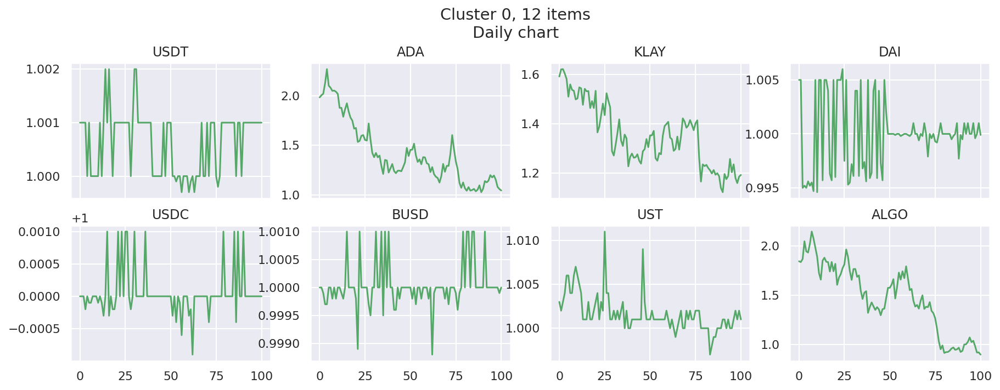

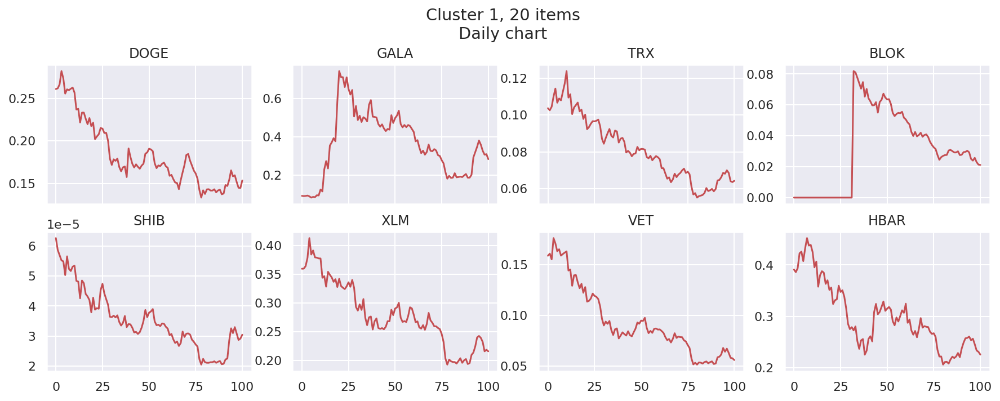

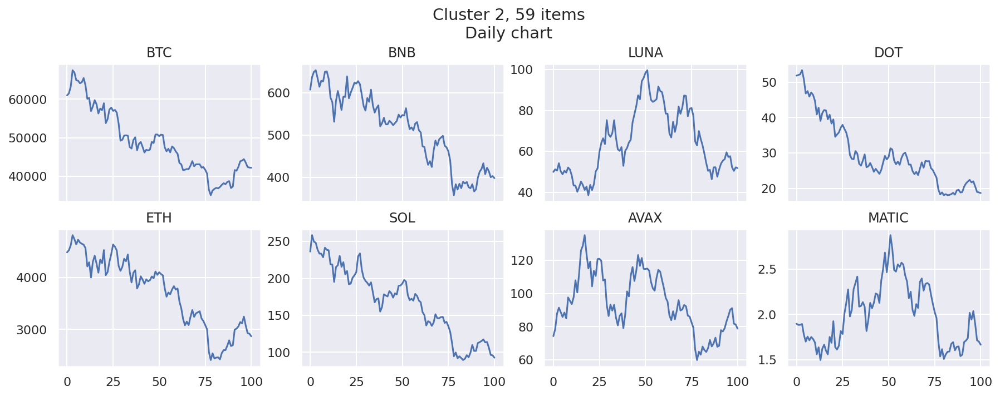

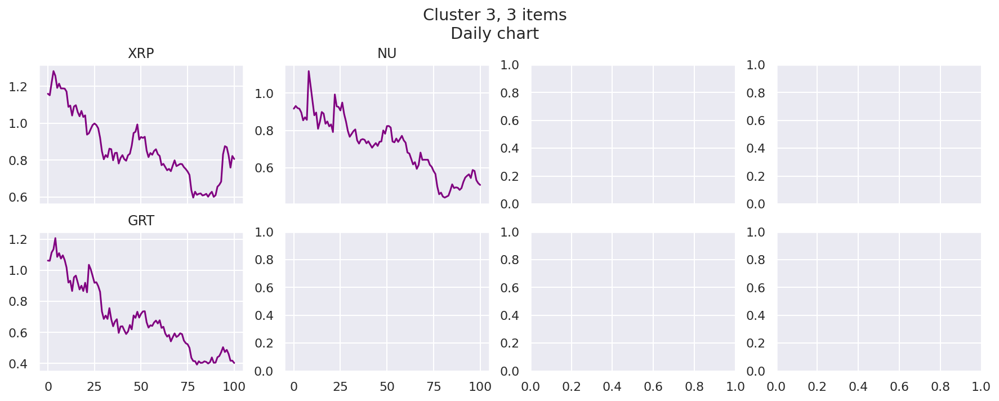

In [34]:
plot_clusters_2(
    data_day,
    Xt=Xt,
    n_clusters=n_clusters,
    random_state=random_state,
    title="Daily chart"
)

![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)
![slice5](https://drive.google.com/uc?export=download&id=1tO_u4a_RioPUolVviZLhJrriXe7kZ3XO) 

#### Spectral domain

In [44]:
cfg_file = tsfel.get_features_by_domain() #"spectral"

##### Extract features

In [45]:
x_temp = tsfel.time_series_features_extractor(cfg_file, data_day["BTC"], window_size=100) # <----------------------------- 30
tf_columns = x_temp.columns
xtf = pd.DataFrame(columns=data_day.columns, index=tf_columns)

# Scale prices?
dd = data_day.copy()
dd = pd.DataFrame(scaler.fit_transform(dd), columns=dd.columns, index=dd.index)

# Fill df with features
for col in xtf.columns:
    xtf[col] = tsfel.time_series_features_extractor(
        cfg_file, data_day[col], window_size=100 # <----------------------------- 30
    ).T
xtf.dropna(inplace=True)
Xt = pd.DataFrame(scaler.fit_transform(xtf), columns=data_day.columns, index=xtf.index)

*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***


##### Estimate optimal number of clusters with elbow method

  0%|          | 0/8 [00:00<?, ?it/s]

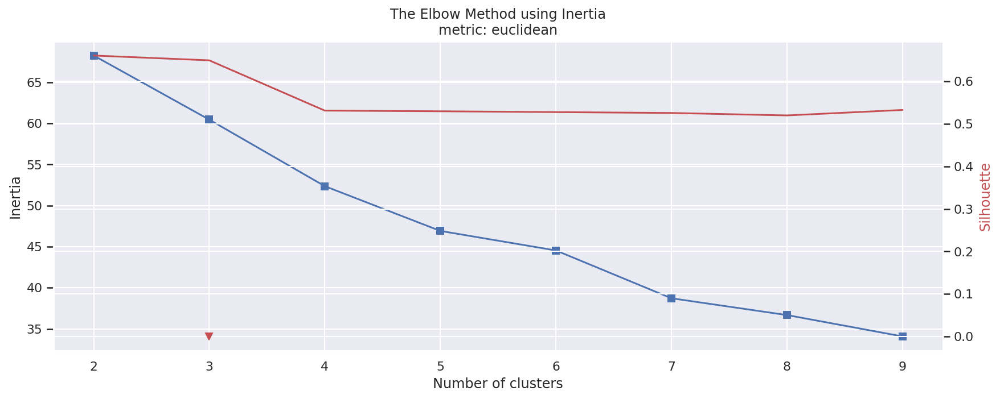

Optimal number of clusters: None


In [46]:
n_clusters = elbow_study(Xt.T, metric="euclidean", model=KMeans)

##### Plot clusters' charts - spectral domain, daily data

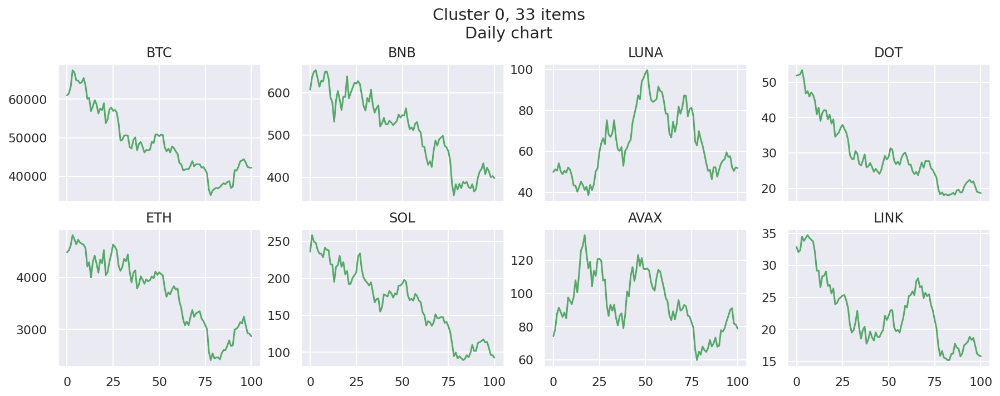

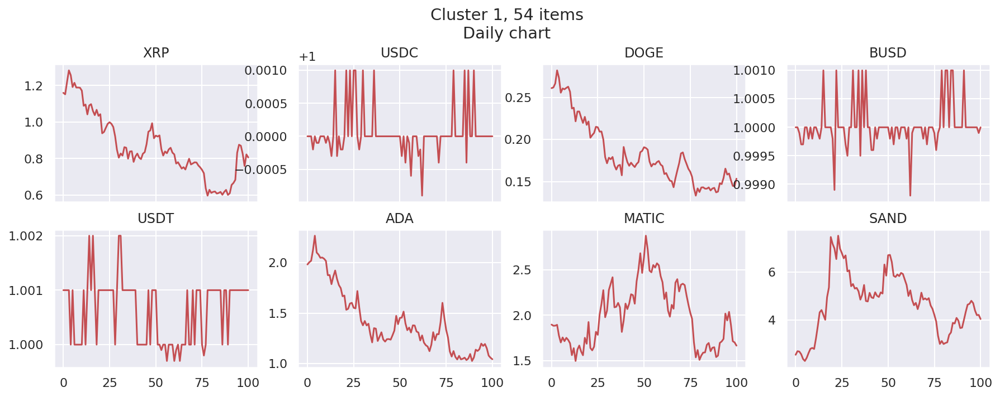

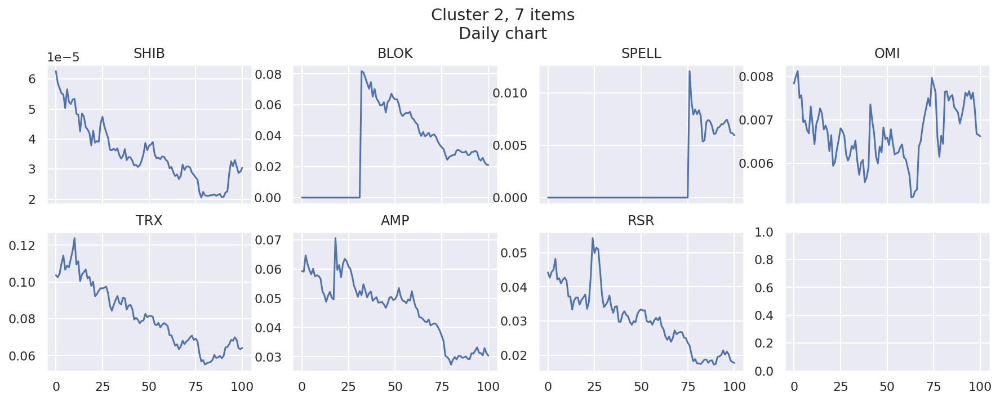

In [47]:
clustered_data = plot_clusters_2(
    data_day,
    Xt=Xt,
    n_clusters=n_clusters,
    random_state=random_state,
    title="Daily chart"
)

![slice5](https://drive.google.com/uc?export=download&id=1tO_u4a_RioPUolVviZLhJrriXe7kZ3XO) 

### Conclusion  
We can see that all clustering methods work quite well with both TSLEARN and TSFEL libraries, producing clusters with distinct common traits, so it is difficult to name the best approach.   

Most often the split is between:  
- BTC and alike, mostly major CCs with high market cap
- Second-tier CCs with medium capitalization and lesser BTC correlation
- Small-cap cheap and volitile coins.

### Practical application  
We will put clustering to test in a [separate notebook](https://colab.research.google.com/github/oort77/OTUS_ADV_HW3/blob/main/notebooks/clustering_mef.ipynb). The idea is to use CCs from two different clusters (computed in spectral domain to make things less obvious) to build a portfolio with lesser overall risk than, say, a portfolio with 5 top coins, namely BTC, ETH,	XRP, USDT, BNB. We will be able to judge the results by comparing the respective portfolios' plots of Markowitz Efficient Fronier.

![slice6](https://drive.google.com/uc?export=download&id=1updrFKIPTzfVguR8_FQ8kTklpbvIrDqo)